# 🤖 **Model Benchmark — Ethereum (ETH)**

### 🎯 **Objective**
Evaluate and compare multiple machine learning models to predict **bearish reversals (crashes)** in Ethereum.

### ⚠️ **Problem Definition**
Binary classification task:

- `True` → Crash (>10% drop within 7 days)
- `False` → No crash

The dataset is **highly imbalanced** (~3% crashes), making this a **rare event prediction problem** in a **time series context**.

### 🔬 **Benchmark Focus**

1. **Baseline comparison**
   - DummyClassifier (majority class)
   - Logistic Regression (with class_weight)

2. **Model comparison (adapted to tabular time series + imbalance)**
   - **Tree-based models** — Random Forest (class_weight="balanced")
   - **Boosting methods** — XGBoost (scale_pos_weight), LightGBM, CatBoost
   - **Linear models** — Logistic Regression (regularized)

3. **Handling class imbalance** — class weights, scale_pos_weight, threshold tuning

4. **Evaluation metrics** — Recall, Precision, F1, **PR-AUC (main metric)**

5. **Model ranking** — Compare models based on PR-AUC and Recall

### 🧪 **Benchmark Methodology**

- Chronological Train/Test split (80/20)
- All tuning performed exclusively on the Train set
- **TimeSeriesSplit (5 folds)** cross-validation: train past → validate future
- **Optuna (100 trials)** Bayesian hyperparameter search per model, optimising PR-AUC
- Metrics averaged across folds: PR-AUC, Recall, Precision, F1

### 🧠 **Rationale for Model Selection**

Same spectrum as the BTC benchmark (`01_model_benchmark_btc.ipynb`):
- **DummyClassifier** — trivial baseline
- **Logistic Regression** — linear baseline
- **Random Forest** — robust non-linear reference
- **XGBoost / LightGBM / CatBoost** — state-of-the-art for tabular + imbalance

### 📏 **Evaluation Metrics**

PR-AUC is the primary metric for rare event detection (~3% crashes). A random model yields PR-AUC ≈ 0.03.

### 📊 **Feature Set**

17 ETH market features selected in `03_eda_eth.ipynb` via combined score (|Spearman| + MI, normalized) and redundancy filter (threshold 0.9):

| Category | Features |
|---|---|
| Momentum | `return_1d`, `return_7d` |
| Volatility | `volatility_7d`, `volatility_30d` |
| Market behavior | `buy_pressure` |
| Risk | `drawdown` |
| Trend | `ma_ratio` |
| Lags | `lag_return_1d`, `lag_return_7d`, `lag_volatility_7d`, `lag_buy_pressure`, `lag_volume_norm` |
| Additional | `momentum_acc`, `momentum_volatility`, `volume`, `number_of_trades`, `quote_asset_volume` |

### 🚀 **Goal**
Establish the **ETH market-only baseline** (PR-AUC, Recall) to compare against enriched feature sets in notebooks 06–09.

In [1]:
import pandas as pd
from pipelines.ml_benchmark import run_benchmark_pipeline

/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### **1. Load ETH Data**

In [2]:
df = pd.read_csv("../../data/gold/market/eth_usdt_1d_features.csv")

print(f"Dataset: {df.shape[0]} rows, {df.shape[1]} columns")
print(f"Date range: {df['open_time'].min()} → {df['open_time'].max()}")
df.head()

Dataset: 3114 rows, 30 columns
Date range: 2017-09-16 → 2026-03-26


,open_time,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,...,lag_volume_norm,lag_buy_pressure,momentum_acc,volatility_ratio,momentum_volatility,pressure_x_return,ma_7,ma_30,ma_ratio,target
0,2017-09-16,255.99,271.81,235.51,249.31,10362.06011,2.647152e+06,8859,3866.60141,995005.326705,...,2.382383,0.418015,-0.190181,1.514538,-0.018696,-0.005442,268.455714,315.714667,0.850311,False
1,2017-09-17,249.32,264.39,239.02,257.55,4614.53337,1.149704e+06,5277,1442.00382,360268.473861,...,1.703868,0.373150,0.047636,1.532832,-0.014528,0.010328,263.320000,314.501000,0.837263,False
2,2017-09-18,257.53,306.22,257.11,294.57,4125.97051,1.182938e+06,3440,2342.68408,669740.521499,...,0.779827,0.312492,0.110688,1.623058,-0.001218,0.081614,262.930000,314.623000,0.835699,True
3,2017-09-19,296.00,300.00,277.41,284.00,1869.90852,5.357736e+05,1896,789.82937,226839.706542,...,0.689572,0.567790,-0.179622,1.630211,-0.004525,-0.015157,261.507143,314.119667,0.832508,False
4,2017-09-20,284.01,294.00,275.91,282.00,1060.56734,3.027397e+05,1431,566.64637,162290.418587,...,0.313636,0.422389,0.028841,1.626730,0.002409,-0.003763,262.234286,312.743333,0.838497,False


### **2. Feature Selection**

17 market features from `03_eda_eth.ipynb` — redundancy filter (correlation > 0.9) applied.

In [3]:
SELECTED_FEATURES = [
    # Momentum
    "return_1d", "return_7d",

    # Volatility
    "volatility_7d", "volatility_30d",

    # Market behavior
    "buy_pressure",

    # Risk
    "drawdown",

    # Trend
    "ma_ratio",

    # Lags
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",

    # Additional
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]

print(f"Dataset shape : {df.shape}")
print(f"Target distribution:\n{df[TARGET].value_counts()}")
df.isna().sum().loc[lambda s: s > 0]

Dataset shape : (3114, 18)
Target distribution:
target
False    2999
True      115
Name: count, dtype: int64


Series([], dtype: int64)

No NaN values — the gold feature pipeline guarantees a complete dataset.

### **3. Model Benchmark**


=== Confusion matrix (OOF, global) — dummy ===


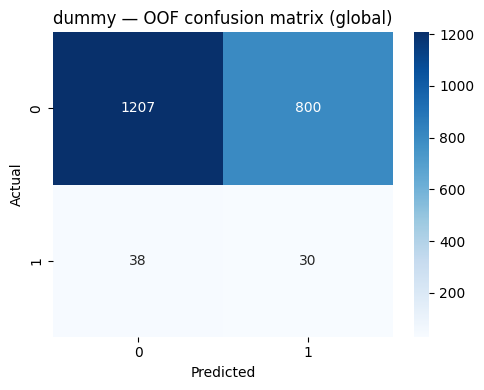


=== Confusion matrix (OOF, global) — logistic ===


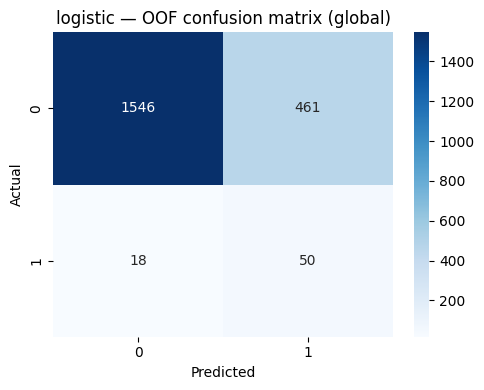


=== Confusion matrix (OOF, global) — random_forest ===


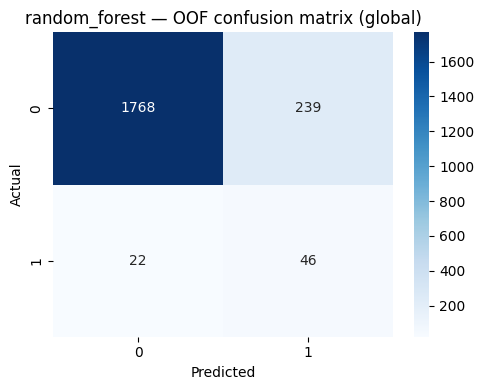


=== Confusion matrix (OOF, global) — xgboost ===


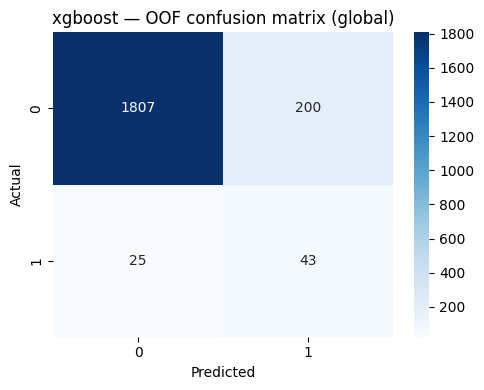

[LightGBM] [Info] Number of positive: 24, number of negative: 392
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2356
[LightGBM] [Info] Number of data points in the train set: 416, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.057692 -> initscore=-2.793208
[LightGBM] [Info] Start training from score -2.793208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

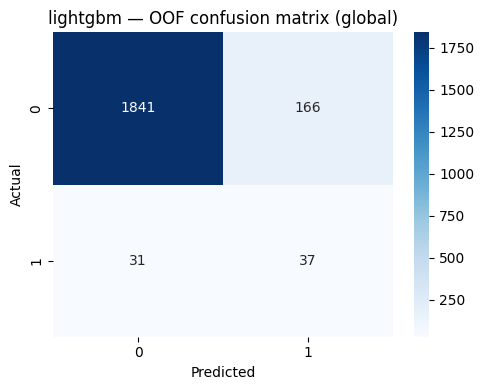


=== Confusion matrix (OOF, global) — catboost ===


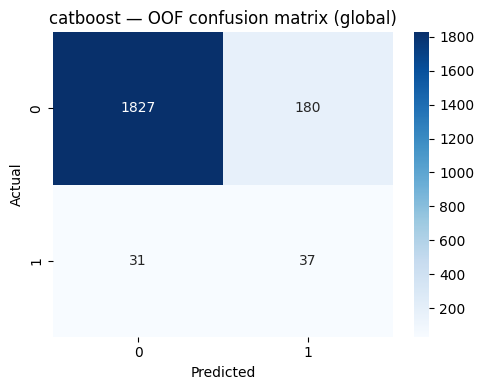

,precision,recall,f1,TP,FP,FN,TN,pr_auc
lightgbm,0.182266,0.544118,0.273063,37.000000,166.000000,31.000000,1841.000000,0.179724
xgboost,0.176955,0.632353,0.276527,43.000000,200.000000,25.000000,1807.000000,0.173153
catboost,0.170507,0.544118,0.259649,37.000000,180.000000,31.000000,1827.000000,0.167498
random_forest,0.161404,0.676471,0.260623,46.000000,239.000000,22.000000,1768.000000,0.160206
logistic,0.097847,0.735294,0.172712,50.000000,461.000000,18.000000,1546.000000,0.101425
dummy,0.036145,0.441176,0.066815,30.000000,800.000000,38.000000,1207.000000,0.035380
mean,0.137521,0.595588,0.218232,40.500000,341.000000,27.500000,1666.000000,0.136231
std,0.053333,0.097085,0.076285,6.601767,228.002924,6.601767,228.002924,0.051945


In [4]:
results = run_benchmark_pipeline(df, verbose=False, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

results_df.loc["mean"] = results_df.select_dtypes("number").mean()
results_df.loc["std"]  = results_df.select_dtypes("number").std()

results_df